In [7]:
import sys
sys.path.append('Desktop/src')
import os
print(os.getcwd())
import copy
import time
import pickle
import numpy as np
import torch
from torchsummary import summary
import torch.nn as nn
from options import args_parser
import argparse
from torch.utils.data import DataLoader, Subset
from update_s3 import LocalUpdate
from utils import test_inference
from models import CNNMnistRelu, CNNMnistTanh
from models import CNNFashion_MnistRelu, CNNFashion_MnistTanh
from models import CNNCifar10Relu, CNNCifar10Tanh
from utils import average_weights, exp_details
from datasets import get_dataset
from logging_results import logging
from opacus.dp_model_inspector import DPModelInspector
from opacus.utils import module_modification
from opacus import PrivacyEngine
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim
from torchvision import models, transforms
from collections import defaultdict
import torch.optim as optim
import warnings
warnings.filterwarnings("ignore", category=UserWarning)
from seed_manager import set_seed
set_seed()


# Initialize the parser
parser = argparse.ArgumentParser(description='Federated Learning with Differential Privacy')

parser.add_argument('--num_users', type=int, default= 10, help="number of users: K")
parser.add_argument('--frac', type=float, default= 0.5, help='the fraction of clients')

## DP arguments
parser.add_argument('--withDP', type=int, default=0, help='WithDP')

# dataset arguments
parser.add_argument('--dataset', type=str, default='dr', help="name of dataset")
parser.add_argument('--num_classes', type=int, default=5, help="number of classes")
parser.add_argument('--device', default='cuda:0', help="To use cuda, set to a specific GPU ID. Default set to use CPU.")
parser.add_argument('--iid', type=int, default=1, help='Default set to IID. Set to 0 for non-IID.')
parser.add_argument('--unequal', type=int, default=1, help='whether to use unequal data splits for non-i.i.d setting (use 0 for equal splits)')
parser.add_argument('--sub_dataset_size', type=int, default=-1, help='To reduce original data to a smaller dataset. For experimental purposes.')
parser.add_argument('--local_test_split', type=float, default=0.3, help='local_test_split')                    
parser.add_argument('--dr_from_np', type=float, default=1, help='for diabetic_retinopathy dataset')                    
parser.add_argument('--exp_name', type=str, default="exp_results", help="The name of current experiment for logging.")

# Parse the arguments, ignoring unknown ones
args, unknown = parser.parse_known_args()

# Setting the device to use CPU explicitly, ignoring CUDA availability
device = torch.device('cpu')
print("Device:", device)



/home/mahsa/Desktop/FL/src
Device: cpu


# Gradient matching

### using Test dataset (aggregated gradients)

0
Performing inversion attack for file: non_private_ML.pth


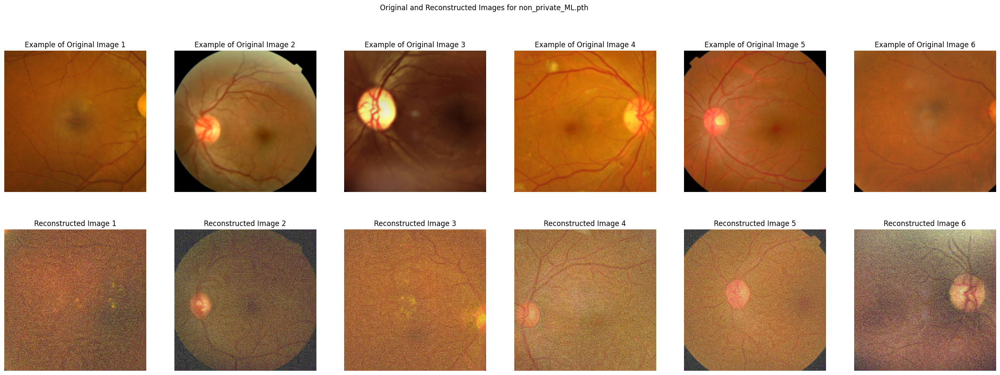

Performing inversion attack for file: non_private_FL.pth


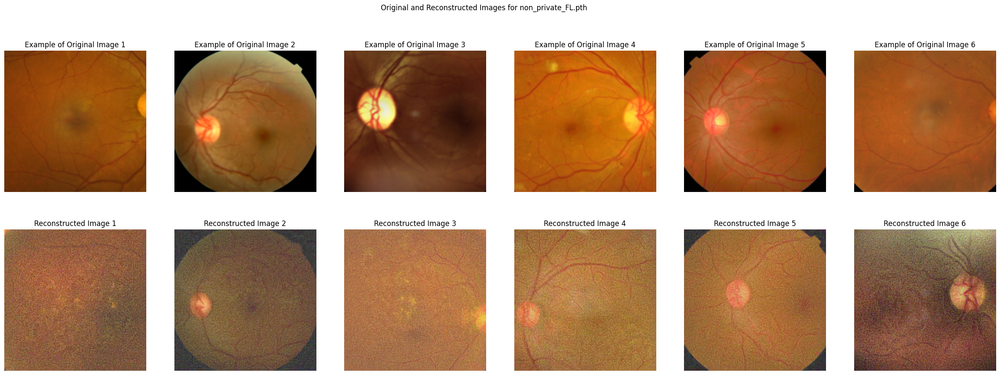

Performing inversion attack for file: Gaussian_noise_multiplier_2_90.pth


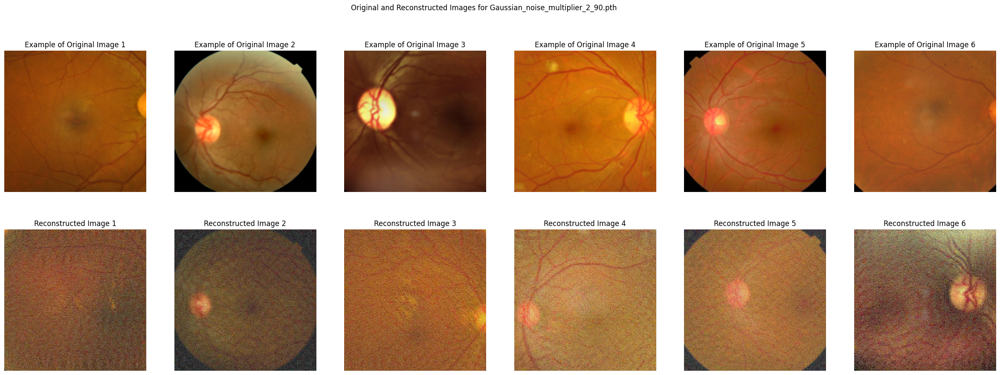

Performing inversion attack for file: Laplace_epsilon_1_50.pth


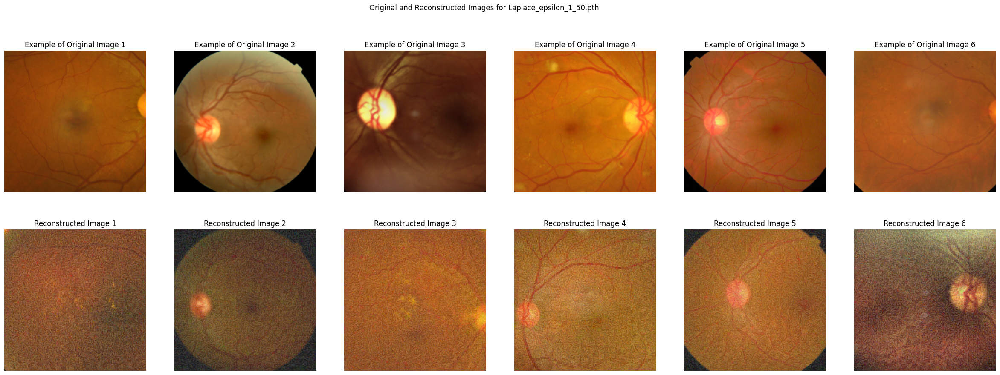

In [12]:
import os
from PIL import Image

# Define the directory to save the images
save_dir = '/home/mahsa/Desktop/FL/src/Inversion_Attack_Results/100 epoch'

# Ensure the save directory exists
os.makedirs(save_dir, exist_ok=True)

# Function to save both original and reconstructed images side-by-side
def save_image_pair(original_tensor, reconstructed_tensor, save_path):
    # Convert tensors to images
    original_np = convert_tensor_to_image(original_tensor)
    reconstructed_np = convert_tensor_to_image(reconstructed_tensor)
    
    # Convert to PIL images
    original_pil = Image.fromarray((original_np * 255).astype(np.uint8))
    reconstructed_pil = Image.fromarray((reconstructed_np * 255).astype(np.uint8))
    
    # Combine original and reconstructed images side-by-side
    combined_image = Image.new('RGB', (original_pil.width + reconstructed_pil.width, original_pil.height))
    combined_image.paste(original_pil, (0, 0))
    combined_image.paste(reconstructed_pil, (original_pil.width, 0))
    
    # Save the combined image
    combined_image.save(save_path)



"""
Note for batch size = 1: 
No Averaging: Each gradient used for the inversion attack corresponds to a single image, ensuring that the noise and the gradient are specific 
to that image.
Direct Impact: The noise added to the gradient affects only that specific image's reconstruction, giving a clear picture of the noise's effect.

Batch Size > 1:
Gradient Averaging: If we use a batch size greater than 1, gradients from multiple images will be averaged.
Blurring of Noise Effects: This averaging could smooth out the noise, potentially diminishing the individual noise 
effect on each image. This might not accurately reflect the true impact of noise on each single image's reconstruction.
"""


# List of .pth files
list_of_pth_files = [
    "non_private_ML.pth",
    "non_private_FL.pth",
    "Gaussian_noise_multiplier_2_90.pth",
    "Laplace_epsilon_1_50.pth",
]

# Directory containing .pth files
pth_files_dir = '/home/mahsa/Desktop/FL/src/Inversion_Attack_Results/100 epoch'

def flatten_and_convert(item):
    if isinstance(item, list):
        flat_list = []
        for sub_item in item:
            flat_list.extend(flatten_and_convert(sub_item))
        return flat_list
    else:
        try:
            return [torch.tensor(item) if not isinstance(item, torch.Tensor) else item]
        except Exception as e:
            print(f"Error converting item to tensor: {e}")
            return [item]

def load_gradients(file_path, num_epochs_to_load=2):
    data = torch.load(file_path, map_location='cpu')
    gradients = data['all_output_gradients'][:num_epochs_to_load]
    
    formatted_gradients = []

    for epoch_idx, epoch in enumerate(gradients):
        client_gradients = defaultdict(list)
        for g_idx, g in enumerate(epoch):
            flat_tensors = flatten_and_convert(g)
            for tensor in flat_tensors:
                client_gradients[tensor.shape].append(tensor)
        formatted_gradients.append(client_gradients)

    return formatted_gradients

# Function to reshape gradients to match model output shape
def reshape_gradients(gradients, target_shape):
    if gradients.shape == target_shape:
        return gradients
    elif gradients.numel() == target_shape.numel():
        return gradients.view(target_shape)
    elif gradients.numel() < target_shape.numel():
        repeated_gradients = gradients.repeat(int(np.ceil(target_shape.numel() / gradients.numel())))
        return repeated_gradients[:target_shape.numel()].view(target_shape)
    else:
        reshaped_gradients = gradients.view(-1)[:target_shape.numel()]
        return reshaped_gradients.view(target_shape)

# Function for inversion attack using aggregated gradients
def perform_inversion_attack(aggregated_gradients, model, initial_inputs, device, save_prefix="", max_images_to_save=6):
    reconstructed_images = []
    input_shape = initial_inputs[0][0].shape
    images_saved = 0  # Counter for saved image pairs
    
    for tensor_idx, (initial_input, _) in enumerate(initial_inputs):
        if images_saved >= max_images_to_save:
            break  # Stop saving after the first 6 image pairs

        initial_input = initial_input.clone().detach().to(device).requires_grad_(True)
        
        optimizer = optim.Adam([initial_input], lr=0.01)
        criterion = nn.MSELoss()
        
        for iter_idx in range(1000):  # Adjust number of iterations as needed
            optimizer.zero_grad()
            input_tensor = initial_input.unsqueeze(0) if initial_input.dim() == 3 else initial_input
            
            model_output = model(input_tensor)
            
            gradient_key = (5, 512, 1, 1)  # Use the shape of the sample gradient tensor
            if gradient_key not in aggregated_gradients or not aggregated_gradients[gradient_key]:
                gradient_tensor = torch.zeros(model_output.shape).to(device)
            else:
                gradient_tensor = aggregated_gradients[gradient_key][tensor_idx % len(aggregated_gradients[gradient_key])].to(device)
            
            gradient_tensor = reshape_gradients(gradient_tensor, model_output.shape)
            
            loss = criterion(model_output, gradient_tensor)
            loss.backward()
            optimizer.step()
        
        reconstructed_image = initial_input.detach().cpu()
        reconstructed_images.append(reconstructed_image)
        
        # Save the original and reconstructed image pair to the specified directory
        if images_saved < max_images_to_save:
            original_image_tensor = initial_inputs[tensor_idx][0]
            save_path = os.path.join(save_dir, f"{save_prefix}_image_pair_{images_saved + 1}.png")
            save_image_pair(original_image_tensor, reconstructed_image, save_path)
            images_saved += 1
    
    return reconstructed_images


def convert_tensor_to_image(tensor):
    if isinstance(tensor, torch.Tensor):
        image = tensor.squeeze().detach().cpu().numpy().transpose(1, 2, 0)
    elif isinstance(tensor, np.ndarray):
        image = tensor.squeeze().transpose(1, 2, 0)
    else:
        raise TypeError("Input should be a torch.Tensor or np.ndarray")
    # Ensure the image is in the range [0, 1]
    image = (image - image.min()) / (image.max() - image.min())
    return image


# Visualization function
def visualize_original_and_reconstructed_images(original_images, reconstructed_images, title):
    num_images = len(reconstructed_images)
    fig, axes = plt.subplots(2, num_images, figsize=(num_images * 5, 10))
    
    for idx, (original, reconstructed) in enumerate(zip(original_images, reconstructed_images)):
        original_np = convert_tensor_to_image(original)
        reconstructed_np = convert_tensor_to_image(reconstructed)
        
        axes[0, idx].imshow(original_np)
        axes[0, idx].axis('off')
        axes[0, idx].set_title(f'Example of Original Image {idx + 1}')
        
        axes[1, idx].imshow(reconstructed_np)
        axes[1, idx].axis('off')
        axes[1, idx].set_title(f'Reconstructed Image {idx + 1}')
    
    fig.suptitle(title)
    plt.show()

# Assuming `get_dataset(args)` is a function to get the original datasets and user groups
train_dataset, test_dataset, user_groups = get_dataset(args)

# Create DataLoader for the original training dataset
original_train_loader = DataLoader(test_dataset, batch_size=1, shuffle=True)

# Placeholder original images (for evaluation)
original_images = [data[0] for data in original_train_loader]

# Create a subset of 50 images from the test dataset
indices = list(range(len(test_dataset)))
subset_indices = indices[:50]
test_subset = Subset(test_dataset, subset_indices)

original_test_loader = DataLoader(test_subset, batch_size=1, shuffle=False)

# Get initial inputs from test dataset
initial_inputs = [data for data in original_test_loader]

# Load gradients from all .pth files
gradients_by_file = {}
for pth_file in list_of_pth_files:
    full_path = os.path.join(pth_files_dir, pth_file)
    gradients_by_file[pth_file] = load_gradients(full_path, num_epochs_to_load=2)  # Only load 2 epochs for quick testing

# Load the SqueezeNet model
model = models.squeezenet1_1(pretrained=True)
model.classifier[1] = nn.Conv2d(512, 5, kernel_size=(1, 1), stride=(1, 1))  # Adjust output to match number of classes
model.num_classes = 5
model = model.eval()  # Set model to evaluation mode
model = model.to(device)


# Perform inversion attacks and evaluate using aggregated gradients
for pth_file, gradients in gradients_by_file.items():
    print(f"Performing inversion attack for file: {pth_file}")
    
    # Load model state
    file_path = os.path.join(pth_files_dir, pth_file)
    data = torch.load(file_path, map_location=device)
    if 'model_state_dict' in data:
        model.load_state_dict(data['model_state_dict'])
        model.eval()

        num_images = 0
        all_reconstructed_images = []

        # Loop over all images in the test dataset
        for images, _ in original_test_loader:
            images = images.to(device)
            for image in images:
                # Perform the attack and save only the first 6 pairs of original and reconstructed images
                x_reconstructed = perform_inversion_attack(gradients, model, [(image, None)], device, save_prefix=f"{pth_file}_reconstructed")
                all_reconstructed_images.append(x_reconstructed[0])

                num_images += 1
    
    else:
        print(f"The key 'model_state_dict' is not found in {pth_file}.")
    
    # Visualize original and reconstructed images
    limited_initial_inputs = initial_inputs[:6]
    limited_original_images = original_images[:6]
    visualize_original_and_reconstructed_images(limited_original_images, all_reconstructed_images[:6], f'Original and Reconstructed Images for {pth_file}')

### one single client

In [ ]:
import os
import torch
from torch.utils.data import DataLoader, Subset
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim
import numpy as np
from torchvision import models, transforms
import torch.nn as nn
from collections import defaultdict
import torch.optim as optim
import matplotlib.pyplot as plt

# List of .pth files
list_of_pth_files = [
    "non_private_ML.pth",
    "non_private_FL.pth",
    "Gaussian_noise_multiplier_2_90.pth",
    "Laplace_epsilon_1_50.pth",
]

# Directory containing .pth files
pth_files_dir = '/home/mahsa/Desktop/FL/src/Inversion_Attack_Results/one client gradient'

def flatten_and_convert(item):
    if isinstance(item, list):
        flat_list = []
        for sub_item in item:
            flat_list.extend(flatten_and_convert(sub_item))
        return flat_list
    else:
        try:
            return [torch.tensor(item) if not isinstance(item, torch.Tensor) else item]
        except Exception as e:
            print(f"Error converting item to tensor: {e}")
            return [item]

def load_gradients(file_path, num_epochs_to_load=2):
    data = torch.load(file_path, map_location='cpu')
    gradients = data['all_output_gradients'][:num_epochs_to_load]

    client_gradients = defaultdict(list)
    for g in gradients:
        flat_tensors = flatten_and_convert(g)
        for tensor in flat_tensors:
            client_gradients[tensor.shape].append(tensor)
    
    return client_gradients

# Function to reshape gradients to match model output shape
def reshape_gradients(gradients, target_shape):
    if gradients.shape == target_shape:
        return gradients
    elif gradients.numel() == target_shape.numel():
        return gradients.view(target_shape)
    elif gradients.numel() < target_shape.numel():
        repeated_gradients = gradients.repeat(int(np.ceil(target_shape.numel() / gradients.numel())))
        return repeated_gradients[:target_shape.numel()].view(target_shape)
    else:
        reshaped_gradients = gradients.view(-1)[:target_shape.numel()]
        return reshaped_gradients.view(target_shape)

# Function for inversion attack using single client gradients
def perform_inversion_attack(client_gradients, model, initial_inputs, device):
    reconstructed_images = []
    input_shape = initial_inputs[0][0].shape
    
    for tensor_idx, (initial_input, _) in enumerate(initial_inputs):
        initial_input = initial_input.clone().detach().to(device).requires_grad_(True)
        
        optimizer = optim.Adam([initial_input], lr=0.01)
        criterion = nn.MSELoss()
        
        for iter_idx in range(1000):  # Adjust number of iterations as needed
            optimizer.zero_grad()
            input_tensor = initial_input.unsqueeze(0) if initial_input.dim() == 3 else initial_input
            
            model_output = model(input_tensor)
            
            gradient_key = (5, 512, 1, 1)  # Use the shape of the sample gradient tensor
            if gradient_key not in client_gradients or not client_gradients[gradient_key]:
                gradient_tensor = torch.zeros(model_output.shape).to(device)
            else:
                gradient_tensor = client_gradients[gradient_key][tensor_idx % len(client_gradients[gradient_key])].to(device)
            
            gradient_tensor = reshape_gradients(gradient_tensor, model_output.shape)
            
            loss = criterion(model_output, gradient_tensor)
            loss.backward()
            optimizer.step()
        
        reconstructed_image = initial_input.detach().cpu()
        reconstructed_images.append(reconstructed_image)
    
    return reconstructed_images

def convert_tensor_to_image(tensor):
    if isinstance(tensor, torch.Tensor):
        image = tensor.squeeze().detach().cpu().numpy().transpose(1, 2, 0)
    elif isinstance(tensor, np.ndarray):
        image = tensor.squeeze().transpose(1, 2, 0)
    else:
        raise TypeError("Input should be a torch.Tensor or np.ndarray")
    # Ensure the image is in the range [0, 1]
    image = (image - image.min()) / (image.max() - image.min())
    return image

# Visualization function
def visualize_original_and_reconstructed_images(original_images, reconstructed_images, title):
    num_images = len(reconstructed_images)
    fig, axes = plt.subplots(2, num_images, figsize=(num_images * 5, 10))
    
    for idx, (original, reconstructed) in enumerate(zip(original_images, reconstructed_images)):
        original_np = convert_tensor_to_image(original)
        reconstructed_np = convert_tensor_to_image(reconstructed)
        
        axes[0, idx].imshow(original_np)
        axes[0, idx].axis('off')
        axes[0, idx].set_title(f'Original Image {idx + 1}')
        
        axes[1, idx].imshow(reconstructed_np)
        axes[1, idx].axis('off')
        axes[1, idx].set_title(f'Reconstructed Image {idx + 1}')
    
    fig.suptitle(title)
    plt.show()

# Assuming `get_dataset(args)` is a function to get the original datasets and user groups
train_dataset, test_dataset, user_groups = get_dataset(args)

# Create DataLoader for the original training dataset
original_train_loader = DataLoader(train_dataset, batch_size=1, shuffle=False)

# Placeholder original images (for evaluation)
original_images = [data[0] for data in original_train_loader]

# Create a subset of 50 images from the test dataset
indices = list(range(len(train_dataset)))
subset_indices = indices[:10]
test_subset = Subset(train_dataset, subset_indices)

original_test_loader = DataLoader(test_subset, batch_size=1, shuffle=False)

# Get initial inputs from test dataset
initial_inputs = [data for data in original_test_loader]

# Load gradients from all .pth files
gradients_by_file = {}
for pth_file in list_of_pth_files:
    full_path = os.path.join(pth_files_dir, pth_file)
    gradients_by_file[pth_file] = load_gradients(full_path, num_epochs_to_load=2)  # Only load 2 epochs for quick testing

# Load the SqueezeNet model
model = models.squeezenet1_1(pretrained=True)
model.classifier[1] = nn.Conv2d(512, 5, kernel_size=(1, 1), stride=(1, 1))  # Adjust output to match number of classes
model.num_classes = 5
model = model.eval()  # Set model to evaluation mode
# Move model to the appropriate device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)

# Perform inversion attacks and evaluate using single client gradients
for pth_file, gradients in gradients_by_file.items():
    print(f"Performing inversion attack for file: {pth_file}")
    
    # Load model state
    file_path = os.path.join(pth_files_dir, pth_file)
    data = torch.load(file_path, map_location=device)
    if 'model_state_dict' in data:
        model.load_state_dict(data['model_state_dict'])
        model.eval()

        num_images = 0
        all_reconstructed_images = []

        # Loop over all images in the test dataset
        for images, _ in original_test_loader:
            images = images.to(device)
            for image in images:
                image_np = image.cpu().numpy().transpose(1, 2, 0)  # Convert to HWC format for SSIM

                # Perform the attack
                x_reconstructed = perform_inversion_attack(gradients, model, [(image, None)], device)

                # Ensure the reconstructed image values are properly clamped
                x_reconstructed_clamped = np.clip(x_reconstructed[0].cpu().numpy().transpose(1, 2, 0), 0, 1)
                all_reconstructed_images.append(x_reconstructed[0])

                num_images += 1

    
    else:
        print(f"The key 'model_state_dict' is not found in {pth_file}.")
    
    # Visualize original and reconstructed images
    limited_initial_inputs = initial_inputs[:5]
    limited_original_images = original_images[:5]
    visualize_original_and_reconstructed_images(limited_original_images, all_reconstructed_images[:5], f'Original and Reconstructed Images for {pth_file}')
